In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Gabor filtresi oluşturma fonksiyonu
def build_gabor_filter(ksize, sigma, theta, lambd, gamma, psi):
    return cv2.getGaborKernel((ksize, ksize), sigma, theta, lambd, gamma, psi, ktype=cv2.CV_32F)

# Gabor filtre bankası oluşturma fonksiyonu
def build_gabor_filter_bank(ksize, sigma, lambd, gamma, num_theta):
    filters = []
    for theta in np.linspace(0, np.pi, num_theta, endpoint=False):
        kern = build_gabor_filter(ksize, sigma, theta, lambd, gamma, 0)
        filters.append(kern)
    return filters

# Görüntüyü Gabor filtreleri ile filtreleme fonksiyonu
def apply_gabor_filters(img, filters):
    filtered_images = []
    for kern in filters:
        filtered_img = cv2.filter2D(img, cv2.CV_8UC3, kern)
        filtered_images.append(filtered_img)
    return filtered_images

# Görüntüyü yükleme ve gri tonlamalı hale getirme
img_path = '/content/1913654.jpg'  # Görüntü dosya yolunu burada belirtin
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

if img is None:
    raise ValueError(f"Görüntü yüklenemedi, lütfen '{img_path}' yolunun doğru olduğundan emin olun.")

# Gabor filtre bankası oluşturma
filters = build_gabor_filter_bank(ksize=31, sigma=4.0, lambd=10.0, gamma=0.5, num_theta=8)
#Daha küçük bir ksize değeri kullanarak, daha küçük dokuları analiz edebilirsiniz.
#Daha büyük bir sigma değeri kullanarak, daha genel doku örüntülerini tanımlayabilirsiniz.
#Daha küçük bir lambd değeri kullanarak, daha yüksek frekanslı doku özelliklerini yakalayabilirsiniz.
#Daha küçük bir gamma değeri kullanarak, daha net doku sınırlarını elde edebilirsiniz.
#Daha fazla num_theta değeri kullanarak, filtrelerin daha fazla yönlü olmasını sağlayabilirsiniz.



# Görüntüyü filtreleme
filtered_images = apply_gabor_filters(img, filters)




# Filtrelenmiş görüntüleri gösterme
plt.figure(figsize=(100, 100))
for i, filtered_img in enumerate(filtered_images):
    plt.subplot(4, 2, i+1)
    plt.imshow(filtered_img, cmap='bone')
#Gri Tonlamalı Haritalar:
#cmap=""  aşşağıdaki seçeneklerden resme  en uygun olan şekilde gösterim yapabilirsiniz
#    'gray': Siyah ve beyaz tonları arasında geçişler sunar, varsayılan renk haritasıdır.
#    'hot': Siyah ile beyaz arasında geçiş yapar, ancak kırmızı tonlarını da içerir, sıcaklık haritaları için idealdir.
#    'cool': Siyah ile beyaz arasında geçiş yapar, ancak mavi tonlarını da içerir, soğukluk haritaları için idealdir.
#    'bone': Siyah ile beyaz arasında yumuşak geçişler sunar, tıbbi görüntüler için idealdir.
#   'gist_earth': Dünya'nın topografik haritasını andıran bir renk paleti sunar, arazi haritaları için idealdir.

#Renkli Haritalar:

#   'viridis': Yeşil tonları arasında geçiş yapar, akışkan akışları görselleştirmek için idealdir.
#   'plasma': Kırmızı, turuncu, sarı ve yeşilin nüanslarını içeren bir renk paleti sunar, plazma gibi yüksek enerjili olayları görselleştirmek için idealdir.
#    'inferno': Kırmızı, turuncu ve sarı tonları arasında geçiş yapar, ısı haritaları için idealdir.
#   'ocean': Mavi ve yeşil tonları arasında geçiş yapar, su kütlelerini görselleştirmek için idealdir.
#    'coolwarm': Mavi ve turuncu tonları arasında geçiş yapar, sıcaklık ve soğukluk değişimlerini görselleştirmek için idealdir.
    plt.title(f'Filtered Image {i+1}')
plt.axis('off')
plt.show()



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Elde edilen dokusal özellik vektörlerini görüntüle
feature_vectors = apply_gabor_filters(img, filters)
print("Dokusal özellik vektörleri:", feature_vectors)

Dokusal özellik vektörleri: [array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [25

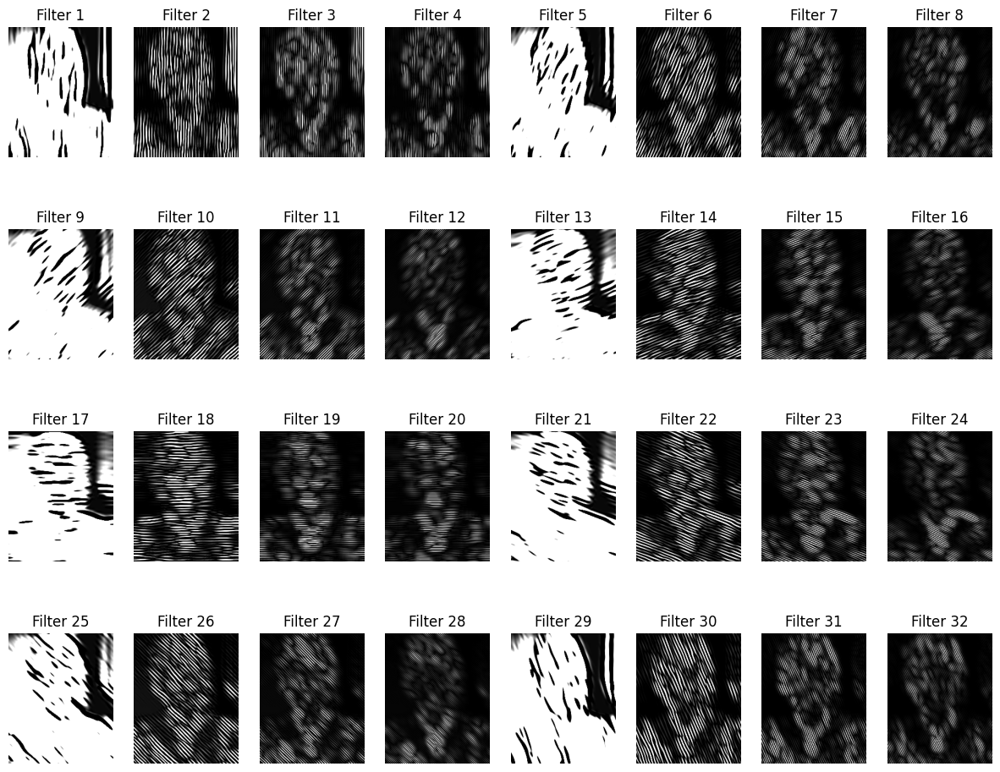

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def build_gabor_filters(ksize=31, sigma=4.0, frequencies=[0.1, 0.2, 0.3, 0.4], gamma=0.5, psi=0, num_orientations=8):
    filters = []
    for theta in np.linspace(0, np.pi, num_orientations, endpoint=False):
        for freq in frequencies:
            kern = cv2.getGaborKernel((ksize, ksize), sigma, theta, 1/freq, gamma, psi, ktype=cv2.CV_32F)
            filters.append(kern)
    return filters

def apply_gabor_filters(img, filters):
    filtered_images = []
    for kern in filters:
        filtered_img = cv2.filter2D(img, cv2.CV_8UC3, kern)
        filtered_images.append(filtered_img)
    return filtered_images

def show_filtered_images(images):
    plt.figure(figsize=(15, 15))
    num_images = len(images)
    cols = 8
    rows = num_images // cols + 1
    for i, filtered_img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(filtered_img, cmap='gray')
        plt.title(f'Filter {i + 1}')
        plt.axis('off')
    plt.show()

# Görüntüyü yükle ve gri tonlamalı hale getir
def load_image(img_path):
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"Görüntü yüklenemedi, lütfen '{img_path}' yolunun doğru olduğundan emin olun.")
    return img

# Resmi işleme sok
def process_image(img_path):
    # Görüntüyü yükle
    img = load_image(img_path)

    # Gabor filtrelerini oluştur
    filters = build_gabor_filters()

    # Görüntüye Gabor filtrelerini uygula
    filtered_images = apply_gabor_filters(img, filters)

    # Filtrelenmiş görüntüleri göster
    show_filtered_images(filtered_images)

# Resim dosya yolu
img_path = '/content/drive/MyDrive/Resimler/deneme4.jpeg'  # Görüntü dosya yolunu buraya belirtin

# Resmi işleme sok
process_image(img_path)
